In [ ]:
!pip install openai==0.28.1
# Text-to-speech + UI tools
!pip install --quiet --no-warn-script-location gtts pyttsx3 edge-tts ipywidgets gtts

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.2/98.2 kB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 40.9 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
import pickle
with open("/content/drive/MyDrive/podcast_summary.pkl", "rb") as f:
    final_summary, selected_title = pickle.load(f)

In [ ]:
# 📦 Standard Library
import asyncio
import os
import requests

# 🧠 AI/LLM & Tokenization
import openai
import tiktoken

# 🖼️ Diffusion Models
from diffusers import StableDiffusionPipeline

# 🗣️ Audio & Speech
import edge_tts
from gtts import gTTS
import IPython.display as ipd

# 📊 Plotting & Imaging
import matplotlib.pyplot as plt
from PIL import Image

# 🎬 Video & Audio Editing
from moviepy.editor import (
    AudioFileClip,
    CompositeAudioClip,
    ImageClip,
    concatenate_videoclips,
)

# 🧪 IPython & Widgets
import torch
import ipywidgets as widgets
from IPython.display import (
    display,
    clear_output,
    Audio,
    Video,
)


### 🔐 Save API Key to `.env`

This code:

1. Asks you to enter your API key securely (it won’t show as you type).
2. Saves it to a hidden `.env` file in the format: `API_KEY=your_key_here`.

✅ Useful for keeping your key safe and loading it later in your code.

> ⚠️ Don’t share your `.env` file publicly.


In [3]:
from getpass import getpass

# Step 1: Prompt for real input
api_key = getpass("🔐 Enter your OpenRouter API key: ")

# Step 2: Write the actual value
with open(".env", "w") as f:
    f.write(f"API_KEY={api_key}\n")

print("✅ Saved API key to .env")


🔐 Enter your API key: ··········
✅ Saved API key to .env


In [ ]:

# ----------------- Optional Final Summary via OpenAI -----------------
openai.api_key = api_key
openai.api_base = "https://openrouter.ai/api/v1"
MODEL = "mistralai/mistral-7b-instruct:free"

tokenizer = tiktoken.get_encoding("cl100k_base")

In [ ]:
# ----------------- Split Text With overlap -----------------
def chunk_by_tokens(text, max_tokens=1000, overlap=100):
    """Split long text into overlapping token-based chunks using tokenizer."""
    tokens = tokenizer.encode(text)
    chunks = []
    start = 0
    while start < len(tokens):
        end = min(start + max_tokens, len(tokens))
        chunk = tokens[start:end]
        chunks.append(tokenizer.decode(chunk))
        start += max_tokens - overlap
    return chunks

# ----------------- Podcast Summarizer Brain -----------------
def summarize_final_long(text: str, title: str) -> str:

    """
    Summarize long podcast text using a free, hosted Small Language Model (SLM) via OpenRouter.

    - Uses Mistral-7B-Instruct (`mistralai/mistral-7b-instruct:free`) accessed through OpenRouter API.
    - Automatically chunks the input text into manageable pieces using token overlap.
    - Generates partial summaries for each chunk, then combines them into a final summary using a second prompt.
    - Runs entirely on free-tier hosted inference (no OpenAI credits needed).

    Returns:
        A final paragraph-style summary incorporating the podcast title.
    """

    chunks = chunk_by_tokens(text)
    summaries = []
    for i, chunk in enumerate(chunks):
        print(f"🔄 Summarizing chunk {i+1}/{len(chunks)}")
        prompt = (
            "You are a podcast summarizer assistant. "
            "Summarize the following podcast segment into a clean and coherent narrative paragraph:\n\n"
            f"{chunk}"
        )
        response = openai.ChatCompletion.create(
            model=MODEL,
            messages=[{"role": "user", "content": prompt}],
            temperature=0.2,
            max_tokens=512
        )
        summaries.append(response.choices[0].message.content.strip())

    print("🧠 Combining all chunk summaries into a final summary...")
    final_prompt = (
    f"You are a podcast summarizer assistant. "
    f"Based on the following partial summaries for the podcast '{title}', write a single, well-structured podcast summary that incorporates the title '{title}' in the summary:\n\n"
    + "\n\n".join(summaries)
    )
    final_response = openai.ChatCompletion.create(
        model=MODEL,
        messages=[{"role": "user", "content": final_prompt}],
        temperature=0.2,
        max_tokens=512
    )
    return final_response.choices[0].message.content.strip()

In [ ]:
final_summary = summarize_final_long(final_summary, selected_title)
print(final_summary)

🔄 Summarizing chunk 1/7
🔄 Summarizing chunk 2/7
🔄 Summarizing chunk 3/7
🔄 Summarizing chunk 4/7
🔄 Summarizing chunk 5/7
🔄 Summarizing chunk 6/7
🔄 Summarizing chunk 7/7
🧠 Combining all chunk summaries into a final summary...
In this podcast titled 'Trump vs Powell, Solving the Debt Crisis, The $10T AGI Prize, GENIUS Act Becomes Law', Gavin Baker discusses a range of economic topics, including the potential impact of the rumored firing of Jerome Powell as the Federal Reserve Chair, the increasing U.S. borrowing costs, and the deficit challenge due to rising interest rates. Baker proposes solutions such as slowing government spending, increasing revenue, and implementing a consumption tax to address the deficit.

The conversation also delves into the importance of free trade, deregulation, and the role of artificial intelligence (AI) in the market. The speakers express excitement about the potential of AI, particularly Artificial Superintelligence (ASI), which could lead to significant ec

In [ ]:
sample_text = final_summary
# Global variables to store voice data

edge_voices = []
gtts_languages = {
    'en': 'English (US)',
    'en-au': 'English (Australia)',
    'en-uk': 'English (UK)',
    'en-ca': 'English (Canada)',
    'en-in': 'English (India)',
    'es': 'Spanish',
    'fr': 'French',
    'de': 'German',
    'it': 'Italian',
    'pt': 'Portuguese',
    'ru': 'Russian',
    'ja': 'Japanese',
    'ko': 'Korean',
    'zh': 'Chinese (Mandarin)'
}


### 🗣️ Text-to-Speech (TTS) Setup and Playback

This code:

1. **Loads English voices** from Edge-TTS for selection.
2. **Updates voice options** when switching between gTTS and Edge-TTS.
3. **Generates speech** using the selected service and plays it.
4. **Handles async execution** for smooth use in Colab or Jupyter.

> Supports both Google TTS (`gTTS`) and Microsoft Edge-TTS.


In [ ]:
# -----------------Initialize and get voices -----------------
async def initialize_voices():
    """Fetch and organize available English voices for Edge-TTS."""
    global edge_voices

    print("🔄 Loading available voices...")

    # Get Edge-TTS voices
    try:
        voices = await edge_tts.list_voices()
        # Filter for English voices and organize by region/gender
        english_voices = [v for v in voices if v['Locale'].startswith('en-')]
        edge_voices = []

        for voice in english_voices:
            display_name = f"{voice['FriendlyName']} ({voice['Gender']}, {voice['Locale']})"
            edge_voices.append((display_name, voice['ShortName']))

        # Sort by name for better organization
        edge_voices.sort(key=lambda x: x[0])
        print(f"✅ Found {len(edge_voices)} Edge-TTS English voices")
    except:
        edge_voices = []
        print("❌ Edge-TTS voices not available")

# ----------------- Voice Options Service -----------------
def update_voice_options(change):
    """Update voice options in the dropdown based on selected TTS service."""
    service = change['new']

    if service == 'gtts':
        voice_dropdown.options = [(name, code) for code, name in gtts_languages.items()]
        voice_dropdown.value = 'en'
    elif service == 'edge':
        voice_dropdown.options = edge_voices
        if edge_voices:
            voice_dropdown.value = edge_voices[0][1]

# ----------------- Function to generate speech -----------------
async def generate_speech(button):
    """Generate and play TTS output using gTTS or Edge-TTS based on selection."""
    with output:
        clear_output(wait=True)

        text = text_input.value.strip()
        if not text:
            status_label.value = "❌ Please enter some text"
            return

        service = service_dropdown.value
        voice = voice_dropdown.value

        status_label.value = "🔄 Generating speech..."

        try:
            if service == 'gtts':
                # Google TTS
                tts = gTTS(text=text, lang=voice, slow=False)
                filename = "generated_speech.mp3"
                tts.save(filename)

                print(f"🎵 Generated with Google TTS ({dict(gtts_languages)[voice]})")
                display(ipd.Audio(filename))
                status_label.value = f"✅ Speech generated successfully with Google TTS"

            elif service == 'edge':
                # Edge TTS
                communicate = edge_tts.Communicate(text, voice)
                filename = "generated_speech.mp3"
                await communicate.save(filename)

                voice_name = next((name for name, code in edge_voices if code == voice), voice)
                print(f"🎵 Generated with Edge-TTS ({voice_name})")
                display(ipd.Audio(filename))
                status_label.value = f"✅ Speech generated successfully with Edge-TTS"

        except Exception as e:
            print(f"❌ Error generating speech: {str(e)}")
            status_label.value = f"❌ Error: {str(e)}"

# ----------------- Async wrapper for button click -----------------
def on_generate_click(button):
    """Wrap the async speech generation call for Colab/Jupyter compatibility."""
    import nest_asyncio
    nest_asyncio.apply()

    loop = asyncio.new_event_loop()
    asyncio.set_event_loop(loop)
    loop.run_until_complete(generate_speech(button))

In [ ]:
# Initialize voices
await initialize_voices()

🔄 Loading available voices...
✅ Found 47 Edge-TTS English voices


### 🎛️ TTS User Interface Setup

This code builds an interactive UI with:

1. A text box to enter your message.
2. A dropdown to choose between Google TTS and Edge-TTS.
3. A voice selector based on the chosen service.
4. A button to generate and play the speech.
5. A status label and audio output area.

> Lets you easily preview speech from custom text using different voices.


In [ ]:

# Create output widget for audio playback
output = widgets.Output()

# Text input for custom text
text_input = widgets.Textarea(
    value=sample_text,
    placeholder='Enter your text here...',
    description='Text:',
    disabled=False,
    layout=widgets.Layout(width='100%', height='100px')
)


# TTS Service selector
service_dropdown = widgets.Dropdown(
    options=[
        ('Google Text-to-Speech (gTTS)', 'gtts'),
        ('Microsoft Edge-TTS', 'edge')
    ],
    value='gtts',
    description='TTS Service:',
    style={'description_width': 'initial'}
)

# Voice dropdown (will be populated based on service selection)
voice_dropdown = widgets.Dropdown(
    options=[],
    description='Voice:',
    style={'description_width': 'initial'}
)

# Generate button
generate_button = widgets.Button(
    description='🎵 Generate Speech',
    disabled=False,
    button_style='success',
    layout=widgets.Layout(width='200px')
)

# Status label
status_label = widgets.Label(value="Ready to generate speech")

# Set up event handlers
service_dropdown.observe(update_voice_options, names='value')

generate_button.on_click(on_generate_click)

# Initialize voice options
update_voice_options({'new': service_dropdown.value})

# Create the UI layout
ui_box = widgets.VBox([
    widgets.HTML("<h3>🎤 Text-to-Speech Voice Selector</h3>"),
    text_input,
    widgets.HBox([service_dropdown, voice_dropdown]),
    generate_button,
    status_label,
    output
], layout=widgets.Layout(padding='20px'))

In [ ]:
# Display the interface
display(ui_box)

In [ ]:
service = service_dropdown.value
voice = voice_dropdown.value
service, voice

('edge', 'en-US-AndrewNeural')

### 🎨 Image Prompt Generator

This function turns a podcast summary into a short, visual prompt for Stable Diffusion.

- Uses an LLM to generate a scene description (under 30 tokens).
- Focuses on key details like topic, setting, mood, style, and lighting.
- Output is concise and ready for image generation.

> Helps create AI art based on podcast content.


In [ ]:
# ----------------- Image Generator -----------------
def generate_image_prompt(text_description):
    """Generate a short, visual Stable Diffusion prompt from a podcast summary."""
    system_prompt = (
        "You are a prompt engineer who converts podcast summaries into short, detailed, and visually descriptive prompts "
        "for Stable Diffusion. The prompt must be less than 30 tokens, and describe a clear scene that could be drawn. "
        "Include core topic, setting, mood, style, and lighting. Avoid extra words or storytelling. Just return the image prompt — nothing else."
    )

    user_prompt = f"Generate a concise image generation prompt based on this podcast summary:\n{text_description}"

    response = openai.ChatCompletion.create(
        model=MODEL,
        messages=[
            {"role": "system", "content": system_prompt},
            {"role": "user", "content": user_prompt}
        ],
        temperature=0.5,
        max_tokens=100,  # Smaller cap to encourage brevity
    )

    raw_prompt = response.choices[0].message["content"].strip()

    # Optional: truncate to ensure CLIP safety (~75 tokens ≈ 400 characters)
    return raw_prompt[:400]  # rough CLIP-safe limit

### 🖼️ Load Stable Diffusion Pipeline

This code loads the Stable Diffusion image generation model (`v1-5`) and moves it to the GPU for faster performance.

- `from_pretrained(...)`: Loads a pre-trained model from Hugging Face.
- `torch_dtype=torch.float16`: Uses half precision to save memory.
- `.to("cuda")`: Runs the model on GPU for better speed.

> This is just one example — larger or newer models may give even better results, but require more resources.


In [ ]:
# Load pipeline
pipe = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16)
pipe = pipe.to("cuda")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Image Generation on a sample.

🧠 Initial Prompt:
 In this podcast titled 'Trump vs Powell, Solving the Debt Crisis, The $10T AGI Prize, GENIUS Act Becomes Law', Gavin Baker discusses a range of economic topics, including the potential impact of the rumored firing of Jerome Powell as the Federal Reserve Chair, the increasing U
🧠 Image Prompt:
 "Federal Reserve Building at dusk, silhouette of Gavin Baker in foreground, discussing economic topics under a spotlight, with charts and graphs representing financial data in the background, contrasted by a looming shadow of a dollar bill symbolizing the U.S. debt crisis." (30 tokens)


  0%|          | 0/150 [00:00<?, ?it/s]

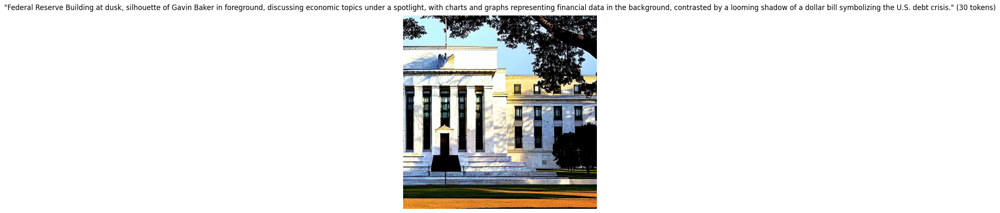

In [ ]:
# Your script scenes (describe each key moment)
script_scenes = sample_text.split(".")[:-1]
prompt = script_scenes[0].replace("\n", "")
print("🧠 Initial Prompt:\n", prompt)
prompt = generate_image_prompt(prompt)
print("🧠 Image Prompt:\n", prompt)

image = pipe(
    prompt,
    negative_prompt="blurry, distorted, ugly, extra limbs, bad hands",
    guidance_scale=7.5,
    num_inference_steps=150,
).images[0]
image_path = "scene.png"
image.save(image_path)
img = Image.open(image_path)

# Plot with caption
plt.figure(figsize=(6, 6))
plt.imshow(img)
plt.axis('off')  # Hide axes
plt.title(prompt, fontsize=12, pad=10)
plt.show()

### 🖼️ Generate Images from Prompts

This cell:

1. Creates a folder for saving images.
2. Loops through each scene prompt and generates an image using Stable Diffusion.
3. Applies a negative prompt to avoid poor-quality results.
4. Saves each image to disk and tracks the file paths.



In [ ]:
%%time
# ✅ Create folder if it doesn't exist
os.makedirs("generated_images", exist_ok=True)
image_paths = []
for i, prompt in enumerate(script_scenes):
    prompt = generate_image_prompt(prompt)
    image = pipe(
        prompt,
        negative_prompt="blurry, distorted, ugly, extra limbs, bad hands",
        guidance_scale=9,
        num_inference_steps=150,
    ).images[0]

    path = f"generated_images/scene_{i}.png"
    image.save(path)
    image_paths.append(path)

print("✅ Images generated:", image_paths)


  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

✅ Images generated: ['generated_images/scene_0.png', 'generated_images/scene_1.png', 'generated_images/scene_2.png', 'generated_images/scene_3.png', 'generated_images/scene_4.png', 'generated_images/scene_5.png', 'generated_images/scene_6.png', 'generated_images/scene_7.png', 'generated_images/scene_8.png', 'generated_images/scene_9.png', 'generated_images/scene_10.png', 'generated_images/scene_11.png', 'generated_images/scene_12.png', 'generated_images/scene_13.png', 'generated_images/scene_14.png', 'generated_images/scene_15.png']
CPU times: user 5min 57s, sys: 1.85 s, total: 5min 59s
Wall time: 6min 39s


In [ ]:
Audio("/content/generated_speech.mp3")

### 🎵 Download and Play Background Music

This code:

1. Downloads an MP3 file from SoundHelix (a site offering royalty-free music examples).
2. Saves the audio as `music.mp3`.
3. Plays the audio in the notebook using IPython's `Audio()`.

> ℹ️ **SoundHelix** is a free service that provides royalty-free, algorithmically generated music for testing and demos.


In [ ]:
music_url = "https://www.soundhelix.com/examples/mp3/SoundHelix-Song-1.mp3"
music_path = "music.mp3"

response = requests.get(music_url)
with open(music_path, 'wb') as f:
    f.write(response.content)

print("✅ Downloaded SoundHelix music")
Audio(music_path)

✅ Downloaded SoundHelix music


### 🖼️ Load Scene Images

Finds and sorts all scene images from the `generated_images` folder.


In [ ]:
# 🔍 Step 1: Dynamically collect all scene images from 'generated_images' folder
image_dir = "generated_images"
image_files = sorted([
    os.path.join(image_dir, f)
    for f in os.listdir(image_dir)
    if f.startswith("scene") and f.endswith((".png", ".jpg", ".jpeg"))
])

num_images = len(image_files)
if num_images == 0:
    raise Exception("❌ No scene images found in 'generated_images' folder.")


### 🎬 Create Final Video with `moviepy`

This code uses the **MoviePy** library to:

1. Load the narration and background music.
2. Time images to match the voiceover length.
3. Mix voice and music into one audio track.
4. Combine images + audio into a video.
5. Export as `final_video.mp4`.

> 🎞️ **MoviePy** is a Python library for video editing — great for creating simple videos with audio, images, and effects, all in code.


In [ ]:

# 🔊 Step 2: Load narration and music
voice = AudioFileClip("/content/generated_speech.mp3")
music = AudioFileClip("music.mp3").subclip(0, voice.duration).volumex(0.1)

# ⏱️ Step 3: Distribute images evenly across voiceover duration
image_duration = voice.duration / num_images
clips = [ImageClip(img).set_duration(image_duration) for img in image_files]

# 🔊 Step 4: Overlay voice + music
final_audio = CompositeAudioClip([music, voice.set_start(0)])

# 🎞️ Step 5: Build video
video = concatenate_videoclips(clips, method="compose")
video = video.set_audio(final_audio)

# 💾 Step 6: Export
video.write_videofile("final_video.mp4", fps=24)


Moviepy - Building video final_video.mp4.
MoviePy - Writing audio in final_videoTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video final_video.mp4



Moviepy - Done !
Moviepy - video ready final_video.mp4


In [ ]:
Video("final_video.mp4", embed=True)